### Density-based Clustering with Feature Reduction

In [41]:
import pandas as pd
import numpy as np
import itertools
from hyperopt import hp, fmin, tpe, space_eval, Trials
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import math
from sklearn.cluster import DBSCAN
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import silhouette_score
from dtaidistance import dtw
import csv
import time
import os

In [42]:
# Create the file to store the experiments

#column_name = ["Number of students", "Delta averaging", "Data smoothing", "Window size", "Alpha", "Number clusters", "Expected critical", "Expected monitor", "Dimension critical", "Dimension monitor", "Cohesion critical", "Cohesion monitor", "Cohesion stable", "Coupling critical-monitor", "Coupling critical-stable", "Coupling monitor-stable", "Fluctuations accuracy critical", "Fluctuations accuracy monitor", "Descending accuracy critical", "Descending accuracy monitor", "Silhouette", "Bayesian time", "Clustering time"]

#with open('results/experiments.csv', 'w') as f:
#    writer = csv.writer(f) 
#    writer.writerow(column_name)

In [43]:
# Parameters used for the analysis

filename = "data/ALL_COURSES_MOD_TS.csv"

folder = "results/plots"
num = len(os.listdir(folder)) + 1
figname = folder + "/clusters_" + str(num)

exp_critical = 0.1 # expected dimension of the critical cluster
exp_monitor = 0.2 # expected dimension of the monitor cluster

# Combinations of parameters used in the Bayesian tuning
parameters = {
    "data_smoothing": ["ma"], #"ma" for moving average and "ema" for exponential moving average
    "window_size": [3],
    "alpha": [0.5],
    "n_components": [2, 3, 4, 5, 6],
    "eps": np.arange(0.5, 3, step=0.2).tolist(),
    "min_samples": np.arange(2, 20, step=2).tolist(),
    "perc": [None]
}

In [44]:
# Read the file of the interpolated time series created in "data_analysis.ipynb"

time_series = pd.read_csv(filename, index_col=0)
display(time_series.shape)

(518, 35)

In [45]:
# Use this to consider only a subset of the time series
#x = 100
#time_series = time_series.iloc[:x]

In [46]:
# Create a copy of the time series

clustering_time_series = time_series.copy(deep=True)
clustering_time_series.index = range(len(clustering_time_series))

In [47]:
# Define the 3 classes
classes = ["critical", "monitor", "stable"]

In [48]:
# Define an objective function of the Bayesian tuning

def objective(args):
    df = clustering_time_series.copy(deep=True)
    if args['data_smoothing'] == "ma":
        df = (df.T.rolling(args['window_size']).mean()).T.iloc[:,args['window_size']-1:]
    elif args['data_smoothing'] == "ema":
        df = df.ewm(axis=1, alpha=args["alpha"], adjust=False).mean()
    x = df.values
    x = StandardScaler().fit_transform(x)
    pca = PCA(n_components=args["n_components"])
    pca_time_series_data = pca.fit_transform(x)
    clustering = DBSCAN(eps=args["eps"], min_samples=args["min_samples"]).fit(pca_time_series_data)
    if len(np.unique(clustering.labels_)) == 2:
        target = len(clustering.labels_) * args["perc"]
        x = len([l for l in clustering.labels_ if l == -1])
        if target > x:
            return np.inf
        else: 
            return x-target
    else:
        return np.Inf

In [49]:
bayesian_time = 0
clustering_time = 0

# Define the model that find a percentage of outliers specified in input

def model(perc):
    parameters["perc"] = [perc]
    global bayesian_time
    global clustering_time
    
    # Define a search space
    keys = list(parameters)
    parameters_list = []
    for values in itertools.product(*map(parameters.get, keys)):
        parameters_list.append(dict(zip(keys, values)))
    print(len(parameters_list))

    space = hp.choice('search_space', parameters_list)
    trials = Trials()
    
    start = time.time()
    
    # Minimize the objective over the space
    best = fmin(objective, space, algo=tpe.suggest, max_evals=100, trials=trials)
    
    bayesian_time = bayesian_time + time.time()-start
    
    result = space_eval(space, best)
    display(result)
    
    start = time.time()
    
    # Data preprocessing
    processed_time_series = clustering_time_series.copy(deep=True)
    if result["data_smoothing"] == "ma":
        processed_time_series = (processed_time_series.T.rolling(result["window_size"]).mean()).T.iloc[:, result["window_size"]-1:]
    elif result["data_smoothing"] == "ema":
        processed_time_series = processed_time_series.ewm(axis=1, alpha=result["alpha"], adjust=False).mean()
    
    x = processed_time_series.values
    x = StandardScaler().fit_transform(x)
    
    # PCA
    pca = PCA(n_components=result["n_components"])
    pca_time_series_data = pca.fit_transform(x)
    
    # DBSCAN
    clustering = DBSCAN(eps=result["eps"], min_samples=result["min_samples"]).fit(pca_time_series_data)
    
    clustering_time = clustering_time + time.time() - start
    
    return clustering.labels_

In [50]:
# Find critical students
labels = model(exp_critical)
critical = [clustering_time_series.iloc[i].name for i in range(len(labels)) if labels[i] == -1]
perc_critical = len(critical)/len(time_series)
display(perc_critical)

585
100%|██████████| 100/100 [00:36<00:00,  2.76trial/s, best loss: 0.19999999999999574]


{'alpha': 0.5,
 'data_smoothing': 'ma',
 'eps': 2.3,
 'min_samples': 10,
 'n_components': 4,
 'perc': 0.1,
 'window_size': 3}

0.10038610038610038

In [51]:
# Delete critical students from all the students
clustering_time_series.drop(critical, axis=0, inplace=True)
display(len(clustering_time_series))

466

In [52]:
# Find monitor students over the remainig students
new_exp_monitor = (exp_monitor*len(time_series))/len(clustering_time_series)
labels = model(new_exp_monitor)
monitor = [clustering_time_series.iloc[i].name for i in range(len(labels)) if labels[i] == -1]
perc_monitor = len(monitor)/len(time_series)
display(perc_monitor)

585


100%|██████████| 100/100 [00:43<00:00,  2.30trial/s, best loss: 5.3999999999999915]


{'alpha': 0.5,
 'data_smoothing': 'ma',
 'eps': 1.4999999999999998,
 'min_samples': 10,
 'n_components': 3,
 'perc': 0.2223175965665236,
 'window_size': 3}

0.21042471042471042

In [53]:
# Redefine labels: critical = 0, monitor = 1 and stable = 2
labels = [2] * len(time_series)
for i in range(len(time_series)):
    if i in critical:
        labels[i] = 0
    elif i in monitor:
        labels[i] = 1

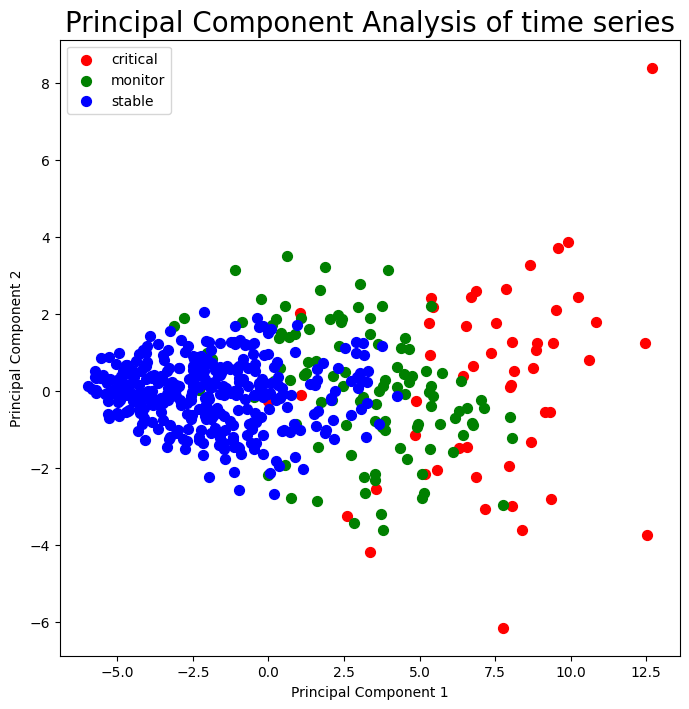

In [54]:
# Plot the distribution on the clsuters in 2 dimensions

x = time_series.values
x = StandardScaler().fit_transform(x)

pca2 = PCA(n_components=2) 
pca2_time_series_data = pca2.fit_transform(x)
pca_time_series = pd.DataFrame(data = pca2_time_series_data, columns = ['pc1', 'pc2'])

plt.figure(figsize=(8,8))
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Principal Component 1', fontsize=10)
plt.ylabel('Principal Component 2', fontsize=10)
plt.title("Principal Component Analysis of time series", fontsize=20)
targets = np.unique(labels)
colors = ['r', 'g', 'b', 'y', 'm', 'k', 'c', 'w']
for target, color in zip(targets, colors):
    indicesToKeep = [i for i in range(len(labels)) if labels[i] == target]
    plt.scatter(pca_time_series.loc[indicesToKeep, 'pc1'], pca_time_series.loc[indicesToKeep, 'pc2'], c = color, s = 50)

plt.legend(classes)
plt.show()

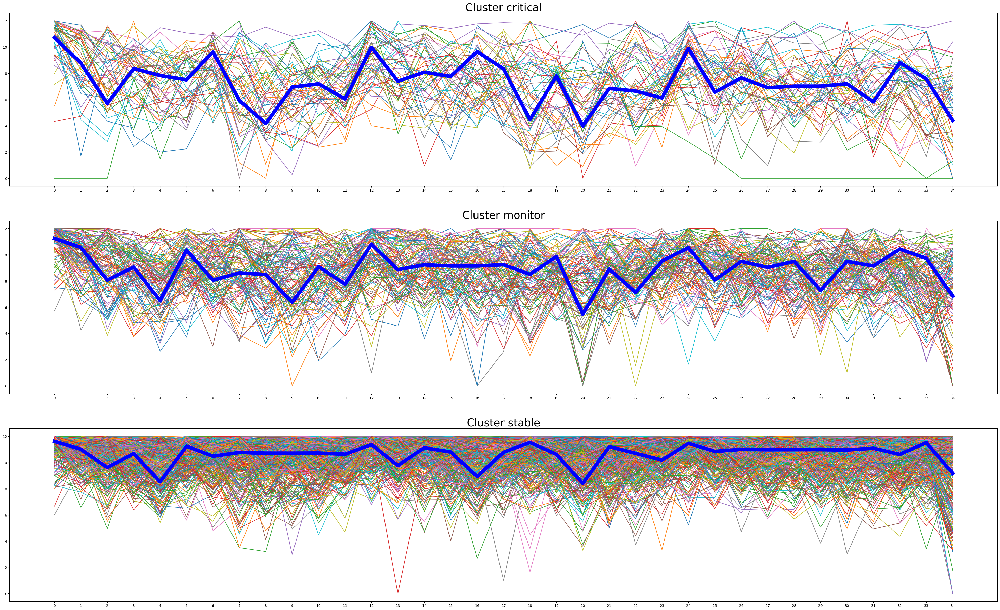

In [55]:
# Plot the clusters of the time series

n_clusters = len(np.unique(labels))

fig, axs = plt.subplots(n_clusters, 1, figsize=(50, 30), sharey=True)
for i in range(len(np.unique(labels))): 
    axs[i].set_title('Cluster ' + classes[i], fontsize=30)
    center = []
    for j in range(len(time_series)):
        # plot cluster label of a specific row (belonging to i'th cluster)
        if labels[j] == i:
            axs[i].plot(time_series.iloc[j])
            center.append(time_series.iloc[j])
    #plotting i'th cluster center
    if len(center) > 0:
        center = dtw_barycenter_averaging(center)
        axs[i].plot(center, 'blue', linewidth=10)
        
plt.savefig(figname)
plt.show()

In [56]:
# Calculate cohesion and coupling

cohesions = []
couplings = []
cohesion_c = []
cohesion_m = []
cohesion_s = []
coupling_cm = []
coupling_cs = []
coupling_ms = []

for i in range(len(time_series)):
    s1 = time_series.iloc[i].to_numpy(dtype=np.double)
    for j in range(i, len(time_series)):
        #cohesion critical
        if labels[j] == labels[i] and labels[i] == 0:
            s2 = time_series.iloc[j].to_numpy(dtype=np.double)
            cohesion_c.append(dtw.distance_fast(s1, s2, use_pruning=True))
        #cohesion monitor
        elif labels[j] == labels[i] and labels[i] == 1:
            s2 = time_series.iloc[j].to_numpy(dtype=np.double)
            cohesion_m.append(dtw.distance_fast(s1, s2, use_pruning=True))
        #cohesion stable
        elif labels[j] == labels[i] and labels[i] == 2:
            s2 = time_series.iloc[j].to_numpy(dtype=np.double)
            cohesion_s.append(dtw.distance_fast(s1, s2, use_pruning=True))
    for j in range(len(time_series)):
        #coupling between critical and monitor
        if labels[i] == 0 and labels[j] == 1:
            s2 = time_series.iloc[j].to_numpy(dtype=np.double)
            coupling_cm.append(dtw.distance_fast(s1, s2, use_pruning=True))
        #coupling between critical and stable
        elif labels[i] == 0 and labels[j] == 2:
            s2 = time_series.iloc[j].to_numpy(dtype=np.double)
            coupling_cs.append(dtw.distance_fast(s1, s2, use_pruning=True))
        #coupling between monitor and stable
        elif labels[i] == 1 and labels[j] == 2:
            s2 = time_series.iloc[j].to_numpy(dtype=np.double)
            coupling_ms.append(dtw.distance_fast(s1, s2, use_pruning=True))
                
    

cohesions.append(1/(sum(cohesion_c)/len(cohesion_c)))
cohesions.append(1/(sum(cohesion_m)/len(cohesion_m)))
cohesions.append(1/(sum(cohesion_s)/len(cohesion_s)))
couplings.append(1/(sum(coupling_cm)/len(coupling_cm)))
couplings.append(1/(sum(coupling_cs)/len(coupling_cs)))
couplings.append(1/(sum(coupling_ms)/len(coupling_ms)))
    
display(cohesions)
display(couplings)

[0.0871700187844627, 0.10241022580474794, 0.13800943846100044]

[0.08206698739936083, 0.05973906364375127, 0.08862925747530206]

In [57]:
# Calculate fluctuations and descending accuracy

stat_time_series = pd.DataFrame(columns=["sum_desc", "mean", "pos"], index=range(len(time_series)))
i = 0
for _, row in time_series.iterrows():
    sum_desc = 0
    mean = 0
    prev = None
    for j, x in enumerate(row):
        if j != 0:
            if x < prev:
                sum_desc += prev - x
            mean += x
        prev = x
    mean = mean / len(row)
    stat_time_series.iloc[i, 0] = sum_desc
    stat_time_series.iloc[i, 1] = mean
    i += 1
    
# Fluctuations accuracy
stat_time_series = stat_time_series.sort_values(by="sum_desc", ascending=False)

match = 0
for id, row in stat_time_series.iloc[:len(critical)].iterrows():
    if id in critical:
        match += 1
fluc_critical_accuracy = match/len(critical)
display(fluc_critical_accuracy)

match = 0    
for id, row in stat_time_series.iloc[:len(monitor)+len(critical)].iterrows():
    if id in monitor:
        match += 1
fluc_monitor_accuracy = match/len(monitor)
display(fluc_monitor_accuracy)
    
# Descending accuracy
stat_time_series = stat_time_series.sort_values(by="mean", ascending=True)

match = 0    
for id, row in stat_time_series.iloc[:len(critical)].iterrows():
    if id in critical:
        match += 1
desc_critical_accuracy = match/len(critical)
display(desc_critical_accuracy)

match = 0    
for id, row in stat_time_series.iloc[:len(monitor)+len(critical)].iterrows():
    if id in monitor:
        match += 1
desc_monitor_accuracy = match/len(monitor)
display(desc_monitor_accuracy)

0.4423076923076923

0.6422018348623854

0.7307692307692307

0.7247706422018348

In [58]:
# Calciulate the Silhouette score of the clustering

silhouette = silhouette_score(time_series, labels, metric="dtw")
display(silhouette)

0.23373005521189935

In [59]:
if parameters["data_smoothing"][0] == "ma":
    parameters["alpha"] = [""]
elif parameters["data_smoothing"][0] == "ema":
    parameters["window_size"] = [""]
else:
    parameters["alpha"] = [""]
    parameters["window_size"] = [""]

In [60]:
# Store the experiment in "results/experiemnts.csv"

row = [len(time_series),
       False,
       parameters["data_smoothing"][0],
       parameters["window_size"][0],
       parameters["alpha"][0],
       n_clusters,
       exp_critical,
       exp_monitor,
       perc_critical,
       perc_monitor,
       cohesions[0],
       cohesions[1],
       cohesions[2],
       couplings[0],
       couplings[1],
       couplings[2],
       fluc_critical_accuracy,
       fluc_monitor_accuracy,
       desc_critical_accuracy,
       desc_monitor_accuracy,
       silhouette,
       bayesian_time,
       clustering_time]
  
with open('results/experiments.csv', 'a') as f:
    writer = csv.writer(f) 
    writer.writerow(row)